## New York City Airbnb Analysis

#### ALY6040 Data Mining Applications

###### Jessica Jiang . Jan 29 2021

In [1]:
## import library
import csv
import numpy as np
import pandas as pd
import random as r
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
import urllib
#import lux

#Plotly Packages
from plotly import tools
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

##impurt model
import statsmodels.api as sm
from statsmodels.formula.api import ols
### evaluating the Model
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression #Linear Regression
from sklearn.preprocessing import PolynomialFeatures #Polynomial Regression
from sklearn.ensemble import RandomForestClassifier #Random Forest

##train and test split
from sklearn.model_selection import train_test_split


pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns",500)
pd.set_option("display.width", 1000)

C:\Users\jessi\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# load excel file
path = "C:/Users/jessi/OneDrive/Desktop/ALY6040/AB_NYC_2019.csv"
airbnb_df = pd.read_csv(path)
airbnb_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [3]:
#checking amount of rows in given dataset to understand the size we are working with
len(airbnb_df)

48895

### EDA

In [4]:
#checking type of every attribution in the dataset
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
# Checking missing value in dataset
#using 'sum' function will show ow many nulls are found in each column in dataset
airbnb_df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

### Deal with missing data
According to the data review, there are some null data in the dataset.
#Name and Host name I can ignore and remove.
#Last review represented by date and reviews_per_month as quantity number, so I will remove the date and replace the reviews_per_month as "0". 

In [6]:
##Remove non-related columns and Null column
airbnb_df.drop(['id','name','host_id','host_name','last_review'],axis=1, inplace=True)

##Replace review_per_month data as "0"
airbnb_df.fillna({'reviews_per_month':0}, inplace=True)

In [7]:
#Review and check the dataset
airbnb_df.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [8]:
#airbnb_df

In [9]:
#Summarize each attribution 
airbnb_df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,48895.0,40.728949,0.054530,40.49979,40.69010,40.72307,40.763115,40.91306
longitude,48895.0,-73.952170,0.046157,-74.24442,-73.98307,-73.95568,-73.936275,-73.71299
price,48895.0,152.720687,240.154170,0.00000,69.00000,106.00000,175.000000,10000.00000
minimum_nights,48895.0,7.029962,20.510550,1.00000,1.00000,3.00000,5.000000,1250.00000
number_of_reviews,48895.0,23.274466,44.550582,0.00000,1.00000,5.00000,24.000000,629.00000
reviews_per_month,48895.0,1.090910,1.597283,0.00000,0.04000,0.37000,1.580000,58.50000
calculated_host_listings_count,48895.0,7.143982,32.952519,1.00000,1.00000,1.00000,2.000000,327.00000
availability_365,48895.0,112.781327,131.622289,0.00000,0.00000,45.00000,227.000000,365.00000


In [10]:
#Heamp map on correlation - check all the variables linearly related
corr = airbnb_df.corr().round(2)
corr

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.00,0.08,0.03,0.02,-0.02,-0.02,0.02,-0.01
longitude,0.08,1.00,-0.15,-0.06,0.06,0.14,-0.11,0.08
price,0.03,-0.15,1.00,0.04,-0.05,-0.05,0.06,0.08
minimum_nights,0.02,-0.06,0.04,1.00,-0.08,-0.12,0.13,0.14
number_of_reviews,-0.02,0.06,-0.05,-0.08,1.00,0.59,-0.07,0.17
reviews_per_month,-0.02,0.14,-0.05,-0.12,0.59,1.00,-0.05,0.16
calculated_host_listings_count,0.02,-0.11,0.06,0.13,-0.07,-0.05,1.00,0.23
availability_365,-0.01,0.08,0.08,0.14,0.17,0.16,0.23,1.00


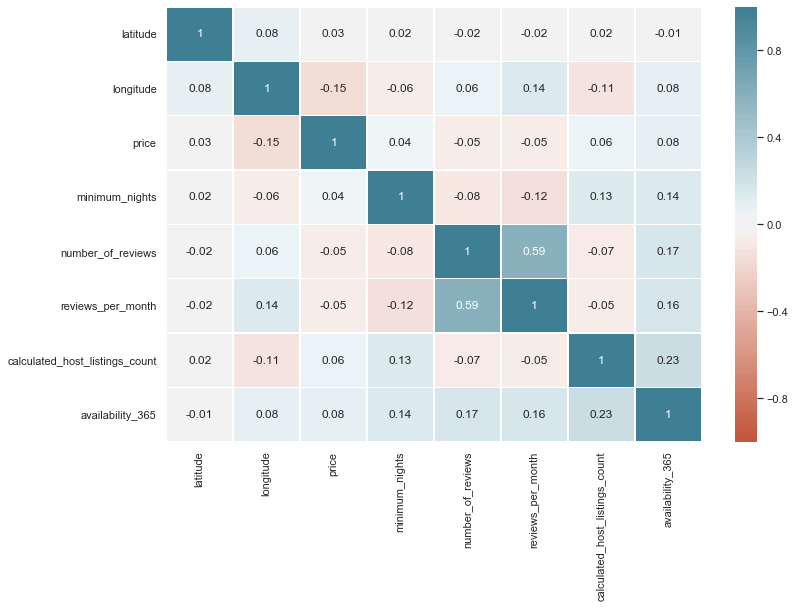

In [11]:
#Correlation matrix heatmap
sns.set(rc={"figure.figsize":(12,8)})
heatmap = sns.heatmap(corr, annot = True, vmin=-1, vmax=1, center= 0, cmap=sns.diverging_palette(20, 220, n=200),linewidths=.5)
plt.show()

Our target is price, in the correlation matrix,we don't find any variable has strong correlation with price. In addition, correlation matirx only calcuate the correlation between all the quantitative variables. 

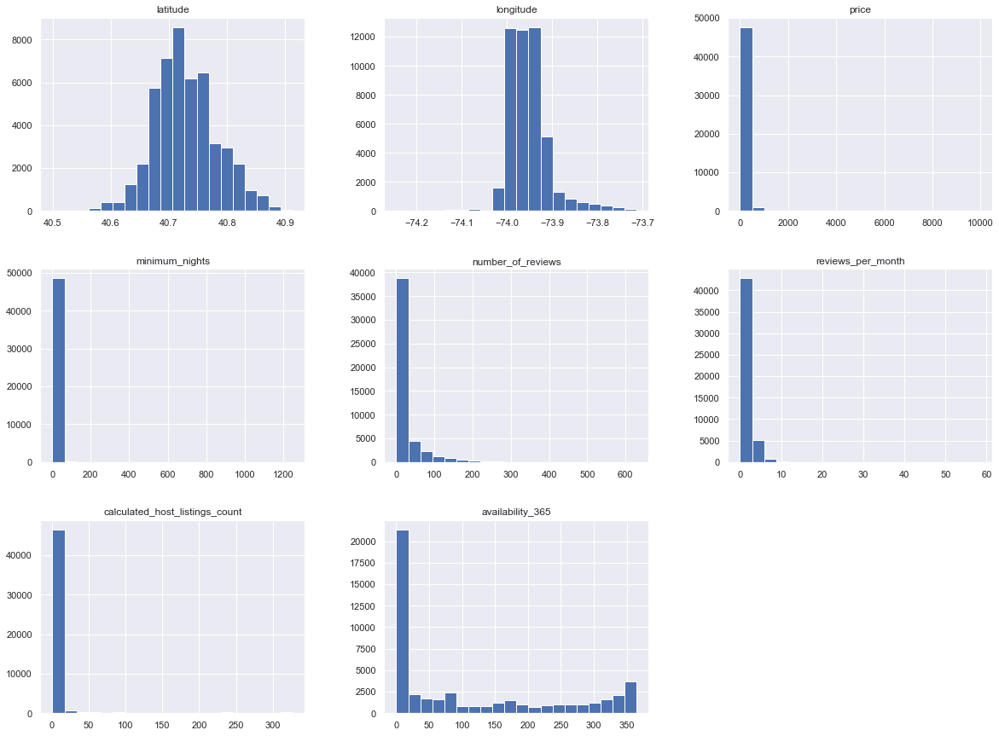

In [12]:
#creating plots on dataset
# Each attribution Histagram 
airbnb_df.hist(bins=20,figsize=(20,15))
plt.show()

In [13]:
#Skewness - measure of symmetry/assymetry of distribution. 
## If the distribution is perfectly symmetrical, the value of skewness is equal to 0. 
## If skewness > 0 : positive, if skewness < 0 : negative
print('Skewness: {}'.format(airbnb_df['price'].skew()))

#Kurtosis - measure of flattening distribution of a feature.
print('Kurtosis: {}'.format(airbnb_df['price'].kurt()))

Skewness: 19.118938995046033
Kurtosis: 585.6728788988286


### Neighbourhood vs Price

In [14]:
airbnb_df['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [15]:
#Neigougood vs Prics
new_df = airbnb_df[['neighbourhood_group','neighbourhood','room_type','price']].copy()
new_column=new_df.groupby(['neighbourhood_group']).count()
new_column

,neighbourhood,room_type,price
neighbourhood_group,,,
Bronx,1091,1091,1091
Brooklyn,20104,20104,20104
Manhattan,21661,21661,21661
Queens,5666,5666,5666
Staten Island,373,373,373


In [16]:
fig_neighbourhood_group= px.bar(new_column, 
             y='neighbourhood',color='neighbourhood', text='neighbourhood', title = 'Share of Neighbourhoods')
fig_neighbourhood_group.show()

In [17]:
fig_boxplot_price = px.box(new_df, x="neighbourhood_group", y="price")
fig_boxplot_price.show()

In [18]:
#Boxplot to check avaialbe days
fig_boxplot_avaiableday = px.box(airbnb_df, x='neighbourhood_group', y='availability_365', color = 'neighbourhood_group')
fig_boxplot_avaiableday.update_traces(quartilemethod="linear") 
fig_boxplot_avaiableday.show()

Manhatten and Brooklyn have the most share of neighbourhood.
Manhatten and Brooklyn have so many extreme price. 

In [19]:
#Close look at Manhattan
Manhattan_df = airbnb_df[(airbnb_df.neighbourhood_group == 'Manhattan')]
Manhattan_df.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
5,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,0.59,1,129
7,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,3.47,1,220


In [20]:
fig_bar_neighbour = px.bar(Manhattan_df, y='neighbourhood', x='price',
             hover_data=['price'], color='price',
             labels={'Price':'Price of Manhattan'})
fig_bar_neighbour.update_layout(barmode='stack', yaxis={'categoryorder':'total descending'})
fig_bar_neighbour.show()

#### Boxplot the price 2000 limit

In [21]:
#2000 Price Limit
df2000 = airbnb_df[(airbnb_df.price <= 2000)]
df2000

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...
48890,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,0.00,2,9
48891,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,0.00,2,36
48892,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,0.00,1,27
48893,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,0.00,6,2


In [22]:
#viloin box with price 2000 limit
fig_violin_2000 = px.violin(df2000, y="neighbourhood_group", x="price", color="neighbourhood_group", box=True, points="all")
fig_violin_2000.show()

### Scattor Plot (Longitude and Latitue)

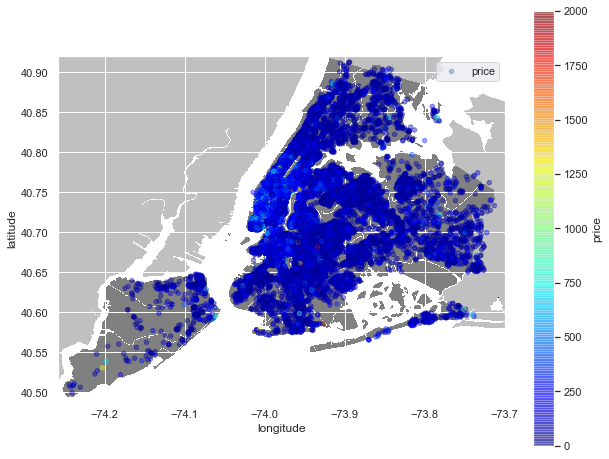

In [23]:
#Date with our given longtitude and latitude columns
#Scattor Plot
#loading the png NYC image found on Google and saving to my local folder along with the project
i=urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img=plt.imread(i)
#scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
df2000.plot(kind='scatter', x='longitude', y='latitude', label='price', c='price', ax=ax,
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(10,8))
plt.legend()
plt.show()                  

### Price ~ Room Type Analysis

In [24]:
roomtype=new_df.groupby(['room_type']).mean().round(2)
roomtype

,price
room_type,
Entire home/apt,211.79
Private room,89.78
Shared room,70.13


In [25]:
fig_roomtype = px.bar(roomtype, 
             y='price', text='price', title = 'Mean Price by Room Type')
fig_roomtype.show()

Therefore, the price seems highly related to the neighbourhood group and room type

### Model

In [26]:
airbnb_df.drop(['neighbourhood','latitude','longitude','number_of_reviews','reviews_per_month'], axis=1, inplace=True)

In [27]:
airbnb_df

,neighbourhood_group,room_type,price,minimum_nights,calculated_host_listings_count,availability_365
0,Brooklyn,Private room,149,1,6,365
1,Manhattan,Entire home/apt,225,1,2,355
2,Manhattan,Private room,150,3,1,365
3,Brooklyn,Entire home/apt,89,1,1,194
4,Manhattan,Entire home/apt,80,10,1,0
...,...,...,...,...,...,...
48890,Brooklyn,Private room,70,2,2,9
48891,Brooklyn,Private room,40,4,2,36
48892,Manhattan,Entire home/apt,115,10,1,27
48893,Manhattan,Shared room,55,1,6,2


In [28]:
#Encode the input Variables
def Encode(airbnb):
    for column in airbnb_df.columns[airbnb_df.columns.isin(['neighbourhood_group', 'room_type'])]:
        airbnb_df[column] = airbnb_df[column].factorize()[0]
    return airbnb_df

airbnb_en = Encode(airbnb_df.copy())

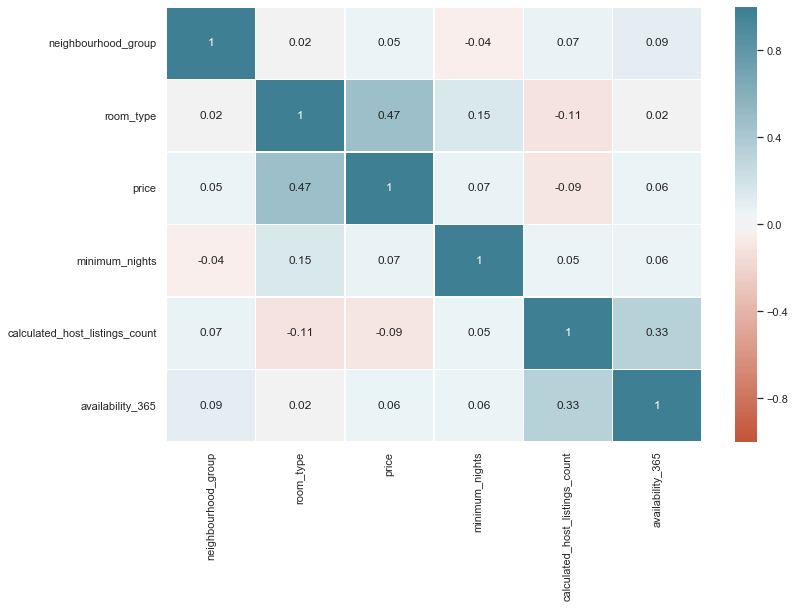

In [29]:
#correlation
corr_en= airbnb_en.corr(method='kendall').round(2)
heatmap = sns.heatmap(corr_en, annot = True, vmin=-1, vmax=1, center= 0, 
                      cmap=sns.diverging_palette(20, 220, n=200),linewidths=.5)
plt.show()

### Regression

In [35]:
#Prepare the deata for training
## Set a variable X equal Country,Age,and Salary, a variable Y equal to Purchased
airbnb_en.dropna(inplace=True)
X = airbnb_en[["neighbourhood_group","room_type","minimum_nights","calculated_host_listings_count","availability_365"]]
#X = np.array(X.fit_transform(X))
y = airbnb_en["price"]
#split the dataset (70% train;30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state = 678)

In [36]:
print(X_train.shape, X_test.shape)

(34226, 5) (14669, 5)


In [37]:
X_train.head()
y_train.head()

8040      90
4132      94
18643    150
31598    400
48015    244
Name: price, dtype: int64

### Training the Simple Linear Regression on the Training set

#### Linear Regreesion

In [38]:
#Create linear regression model
lin_reg = LinearRegression()

In [39]:
#Train/fit lm on the training data
lin_reg.fit(X_train,y_train)

LinearRegression()

In [40]:
#The coefficients of the model
lin_reg.intercept_, lin_reg.coef_

(84.50966650550784,
 array([-1.12128579, 89.85548043,  0.34406684,  0.13285075,  0.13307394]))

In [41]:
#Predicting Test Data
y_predictions = lin_reg.predict(X_test)

In [42]:
print("""
        Mean Squared Error: {}
        R2 Score: {}
        Mean Squared Error: {}
     """.format(
        np.sqrt(metrics.mean_squared_error(y_test,y_predictions)),
        r2_score(y_test,y_predictions) * 100,
        mean_squared_error(y_test,y_predictions)
        ))


        Mean Squared Error: 214.36735290368586
        R2 Score: 5.193012811785646
        Mean Squared Error: 45953.36199093339
     


#### Polynomial Regreesion

In [43]:
poly_features = PolynomialFeatures(degree = 2, include_bias = False)
#transform the features to higher degree feature
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.fit_transform(X_test)

In [44]:
#Create Polynomial regression model
poly_model = LinearRegression()

In [45]:
#Train/fit Polynomial regression model on the training data
poly_model.fit(X_train_poly,y_train)

LinearRegression()

In [46]:
#The coefficients of the model
poly_model.intercept_, poly_model.coef_

(62.38715792722944,
 array([ 5.00370582e+01,  2.50064037e+02,  8.16836174e-01,  6.50191752e-01,
        -3.31314413e-02, -1.73744563e+01, -8.15367583e-01,  2.91475042e-01,
        -4.48323252e-01, -7.92919760e-03, -1.39016569e+02, -1.05345009e+00,
         6.68232228e-02,  1.37377707e-01,  5.25682418e-05, -4.10184497e-03,
        -5.61542477e-04,  1.51262664e-03, -2.28161203e-03,  4.38933073e-04]))

In [47]:
#Predicting on the training dataset
y_train_predicted = poly_model.predict(X_train_poly)

#Predicting on the test data
y_test_predicted = poly_model.predict(X_test_poly)

In [48]:
print("""
        Mean Squared Error: {}
        R2 Score: {}
        Mean Squared Error: {}
     """.format(
        np.sqrt(metrics.mean_squared_error(y_test,y_test_predicted)),
        r2_score(y_test,y_test_predicted) * 100,
        mean_squared_error(y_test,y_test_predicted)
        ))


        Mean Squared Error: 210.64832083824078
        R2 Score: 8.454066316962894
        Mean Squared Error: 44372.71507197043
     


Conclusion, in this case, polynomial regression is better than linear regression. 